<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Base/AI_HW1_Regression_with_inference_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

`Your answer here` Чтобы можно было повторить результаты при проверке

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [64]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [4]:
df_train.sample(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [4]:
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [5]:
df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


In [7]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


Пропуски есть в mileage, engine, max_power, torque, seats

In [8]:
df_train[df_train.duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
326,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6880,Renault Captur 1.5 Diesel RXT,2018,1265000,12000,Diesel,Individual,Manual,First Owner,20.37 kmpl,1461 CC,108.45 bhp,240Nm@ 1750rpm,5.0
6881,Maruti Ciaz Alpha Diesel,2019,1025000,32000,Diesel,Individual,Manual,First Owner,28.09 kmpl,1248 CC,88.50 bhp,200Nm@ 1750rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [9]:
df_test[df_test.duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
200,Maruti Swift AMT VVT VXI,2019,650000,5621,Petrol,Trustmark Dealer,Automatic,First Owner,22.0 kmpl,1197 CC,81.80 bhp,113Nm@ 4200rpm,5.0
235,Hyundai Grand i10 1.2 CRDi Sportz,2017,450000,56290,Diesel,Dealer,Manual,First Owner,24.0 kmpl,1186 CC,73.97 bhp,190.24nm@ 1750-2250rpm,5.0
238,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
253,Tata Safari Storme EX,2015,503000,110000,Diesel,Individual,Manual,First Owner,14.1 kmpl,2179 CC,147.94 bhp,320Nm@ 1500-3000rpm,7.0
269,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
934,Mercedes-Benz S-Class S 350 CDI,2017,6000000,37000,Diesel,Dealer,Automatic,First Owner,13.5 kmpl,2987 CC,254.79 bhp,620Nm@ 1600-2400rpm,5.0
936,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
949,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
971,Maruti Ertiga SHVS ZDI Plus,2017,750000,50000,Diesel,Individual,Manual,First Owner,24.52 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,7.0


Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

mileage, engine, max_power, torque, seats

In [65]:
df_train['seats'].fillna(df_train['seats'].median(), inplace=True)

C:\Users\palag\AppData\Local\Temp\ipykernel_14576\3501432575.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train['seats'].fillna(df_train['seats'].median(), inplace=True)


In [66]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6999 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


In [67]:
df_test['seats'].fillna(df_test['seats'].median(), inplace=True)

C:\Users\palag\AppData\Local\Temp\ipykernel_14576\1788158624.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seats'].fillna(df_test['seats'].median(), inplace=True)


In [9]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          1000 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


In [68]:
def preproc_median(df):
    tmp = df['max_power'].agg(lambda x: str(x)[:-3])
    tmp[(tmp=='') | (tmp ==' ')] = 'Nan'
    df['max_power'] = tmp.agg(float)
    df['max_power'].fillna(df['max_power'].median(), inplace=True)
    
    df['engine'][df['engine'].isna()] = 'Nan CC'
    tmp = df['engine'].agg(lambda x: str(x)[:-2])
    df['engine'] = tmp.agg(float)
    df['engine'].fillna(df['engine'].median(), inplace=True)
    
    tmp = df['mileage'].agg(lambda x: str(x)[:next((i for i, c in enumerate(str(x)) if c.isalpha()), -1)])
    tmp[(tmp=='') | (tmp ==' ')] = 'Nan'
    df['mileage'] = tmp.agg(float)
    df['mileage'].fillna(df['mileage'].median(), inplace=True)
    
    return df

In [69]:
df_train = preproc_median(df_train)
df_test = preproc_median(df_test)

C:\Users\palag\AppData\Local\Temp\ipykernel_14576\2304306396.py:2: FutureWarning: using <function preproc_median.<locals>.<lambda> at 0x0000024A9DBEAAC0> in Series.agg cannot aggregate and has been deprecated. Use Series.transform to keep behavior unchanged.
  tmp = df['max_power'].agg(lambda x: str(x)[:-3])
C:\Users\palag\AppData\Local\Temp\ipykernel_14576\2304306396.py:4: FutureWarning: using <class 'float'> in Series.agg cannot aggregate and has been deprecated. Use Series.transform to keep behavior unchanged.
  df['max_power'] = tmp.agg(float)
C:\Users\palag\AppData\Local\Temp\ipykernel_14576\2304306396.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method

### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [8]:
df_train[df_train.loc[:, df_train.columns !='selling_price'].duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.90,1197.0,82.00,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,85.80,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.10,1197.0,85.80,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.60,1999.0,177.00,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37,2487.0,214.56,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.00,995.0,62.00,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.40,1498.0,98.63,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59,1248.0,74.00,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,140Nm@ 1800-3000rpm,5.0


In [70]:
X = df_train.loc[:, df_train.columns !='selling_price']
y = df_train['selling_price']

X = X.drop_duplicates()
y = y[X.index]

X = X.reset_index(drop=True)
y = y.reset_index(drop=True)

X['selling_price'] = y

df_train = X
df_train

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,selling_price
0,Maruti Swift Dzire VDI,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190Nm@ 2000rpm,5.0,450000
1,Skoda Rapid 1.5 TDI Ambition,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250Nm@ 1500-2500rpm,5.0,370000
2,Hyundai i20 Sportz Diesel,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0,225000
3,Maruti Swift VXI BSIII,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,"11.5@ 4,500(kgm@ rpm)",5.0,130000
4,Hyundai Xcent 1.2 VTVT E Plus,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75nm@ 4000rpm,5.0,440000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.1Nm@ 3000rpm,5.0,120000
5836,Maruti Wagon R VXI BS IV with ABS,2013,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90Nm@ 3500rpm,5.0,260000
5837,Hyundai i20 Magna,2013,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.7Nm@ 4000rpm,5.0,320000
5838,Hyundai Verna CRDi SX,2007,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,"24@ 1,900-2,750(kgm@ rpm)",5.0,135000


In [71]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

Первые 2 пункта были выполнены в задании 1

In [72]:
df_train.drop(columns=['torque'], inplace=True)
df_test.drop(columns=['torque'], inplace=True)
print(df_train.columns.shape)

(12,)


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [73]:
df_train = df_train.astype({'engine':'int', 'seats':'int'})
df_test = df_test.astype({'engine':'int', 'seats':'int'})

### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [115]:
df_train.describe()

,year,km_driven,mileage,engine,max_power,seats,selling_price
count,5840.000000,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5.840000e+03
mean,2013.428425,7.395224e+04,19.428611,1429.448973,87.952905,5.426712,5.229601e+05
std,4.095622,6.007114e+04,3.986026,485.662834,31.577030,0.982344,5.354320e+05
min,1983.000000,1.000000e+00,0.000000,624.000000,32.800000,2.000000,2.999900e+04
25%,2011.000000,3.900000e+04,16.950000,1197.000000,68.000000,5.000000,2.500000e+05
50%,2014.000000,7.000000e+04,19.300000,1248.000000,82.000000,5.000000,4.050000e+05
75%,2017.000000,1.000000e+05,22.300000,1498.000000,99.000000,5.000000,6.400000e+05
max,2020.000000,2.360457e+06,42.000000,3604.000000,400.000000,14.000000,1.000000e+07


In [116]:
df_test.describe()

,year,km_driven,mileage,engine,max_power,seats,selling_price
count,931.000000,931.000000,931.000000,931.000000,931.000000,931.000000,9.310000e+02
mean,2013.506982,72786.747583,19.378464,1435.484425,88.587143,5.409237,5.805821e+05
std,4.043408,48823.924040,3.994493,515.908793,32.711134,0.924622,7.399264e+05
min,1995.000000,1303.000000,0.000000,624.000000,34.200000,4.000000,4.000000e+04
25%,2011.000000,39000.000000,16.500000,1196.500000,68.050000,5.000000,2.500000e+05
50%,2014.000000,65000.000000,19.330000,1248.000000,82.850000,5.000000,4.040000e+05
75%,2017.000000,100000.000000,22.320000,1498.000000,100.000000,5.000000,6.415000e+05
max,2020.000000,375000.000000,32.260000,3604.000000,280.000000,9.000000,1.000000e+07


In [117]:
df_train.describe(include=[object])

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [118]:
df_test.describe(include=[object])

,name,fuel,seller_type,transmission,owner
count,931,931,931,931,931
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,14,498,813,839,562


## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

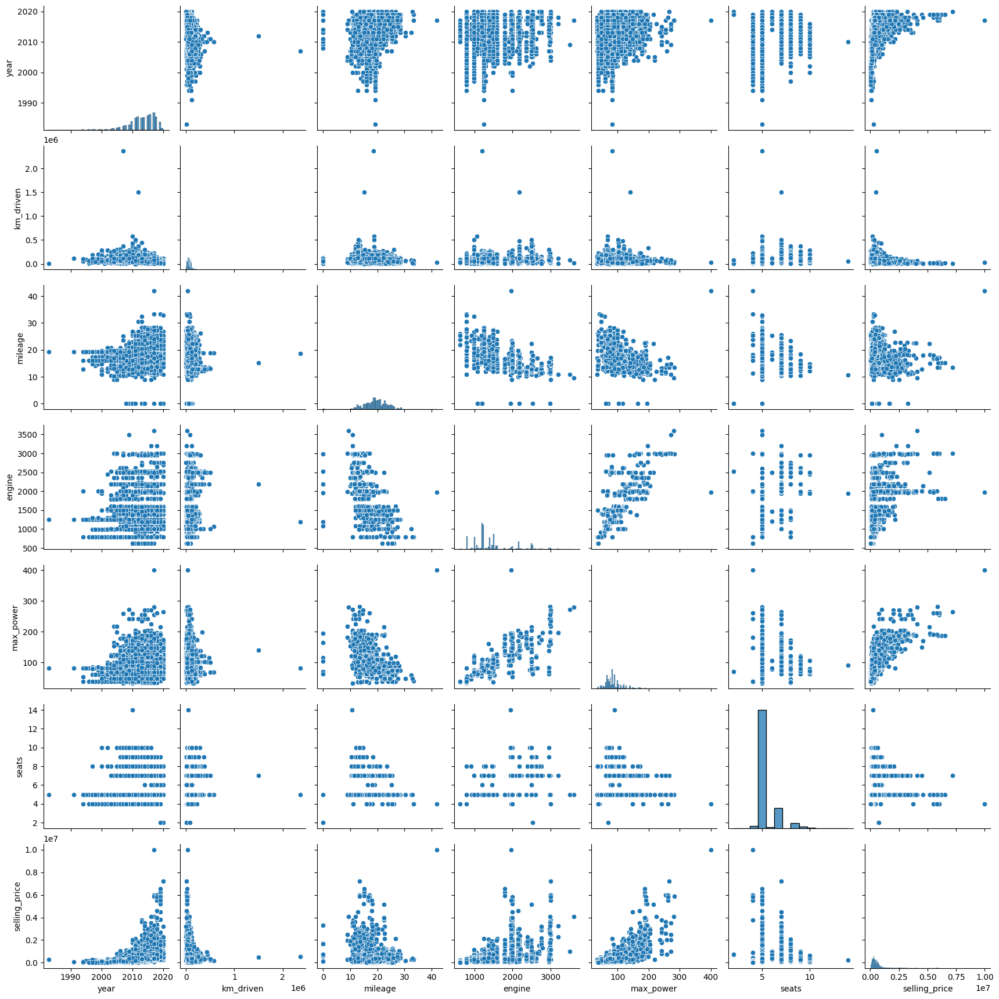

In [33]:
sns.pairplot(df_train.select_dtypes(exclude=['object']))

`Your answer here`

Можно преположить связь. Так чем больше год выпуска, тем дороже средняя цена, чем меньше пробег, тем дороже авто, чем больше максимальная мощность, тем дороже авто.

Можно. Стоимсоть положительно коррелирует с годом выпуска (year), максимальной мощностью (max_power) и количеством оборотов двигателя (engine) и отрицательно с пробегом (km_driven).

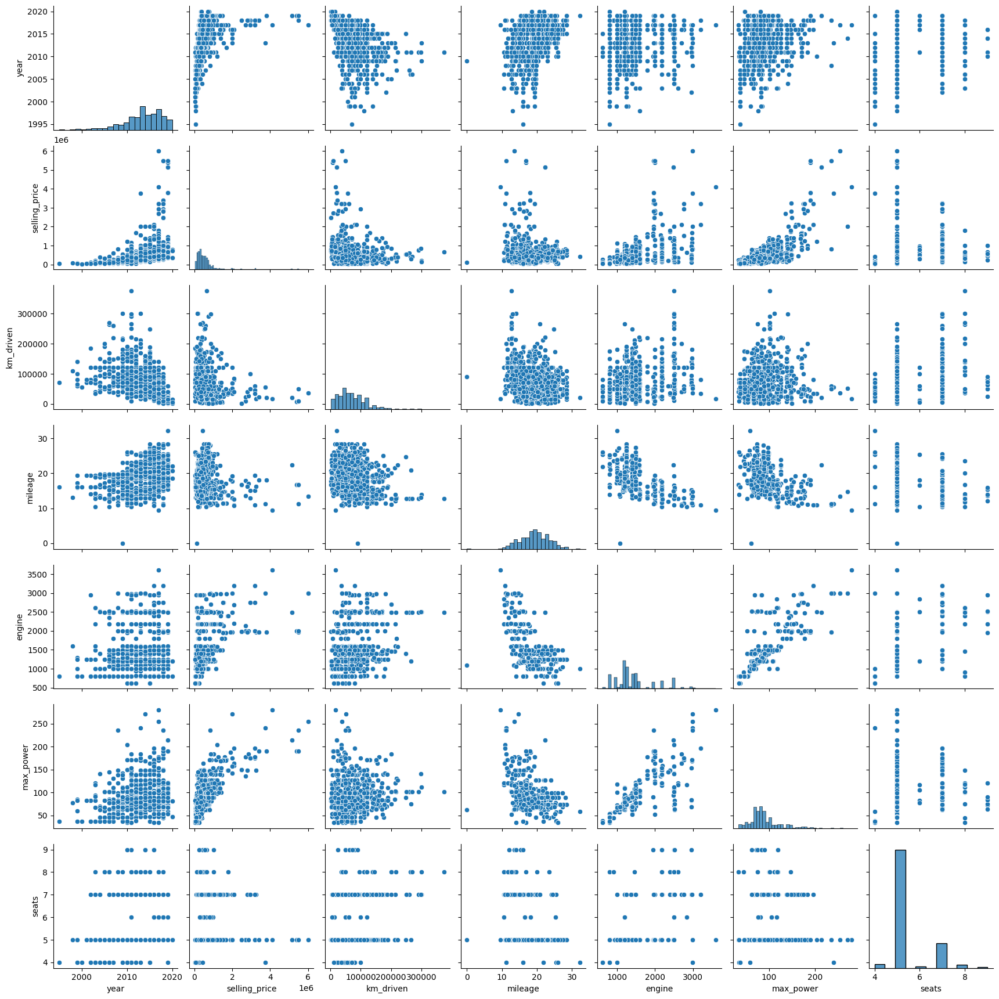

In [34]:
sns.pairplot(df_test.select_dtypes(exclude=['object']))

`Your answer here`

Да, похожими

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


<Axes: >

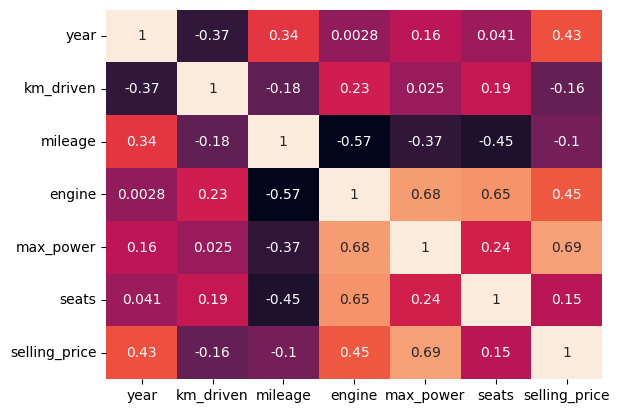

In [35]:
sns.heatmap(df_train.corr(numeric_only=True), annot=True, cbar=False)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

`Your answer here`

- year и engine меньше всего коррелируют между собой
- engine и max_power, engine и seats, engine и mileage, max_power и selling_price
- Да, правильно. Хоть коэффициент корреляции по модулю небольшой, но все же не близок к нулю

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

In [ ]:
# your code here

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [74]:
y_train = df_train['selling_price']
X_train = df_train.loc[:, df_train.columns != 'selling_price'].select_dtypes(exclude=['object'])

In [75]:
assert X_train.shape == (5840, 6)

In [76]:
y_test = df_test['selling_price']
X_test = df_test.loc[:, df_test.columns != 'selling_price'].select_dtypes(exclude=['object'])

In [77]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [80]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [81]:
train_pred_lr1 = lr.predict(X_train)
test_pred = lr.predict(X_test)
print(f"Train R2 {r2_score(y_train, train_pred_lr1)}, MSE {MSE(y_train, train_pred_lr1)}")
print(f"Test R2 {r2_score(y_test, test_pred)}, MSE {MSE(y_test, test_pred)}")

Train R2 0.593214521620736, MSE 116600313590.75023
Test R2 0.5946593477101488, MSE 233001381697.32007


Значения на train и test для R2 не сильно отличаются, значит у модели хорошая обощающая способность, но само значение далеко от идеала, что говорит о недообученности модели. Возможно, добавление категориальных признаков положительно скажется на значении этой модели.

Значения MSE тоже говорят о недообученности модели.

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [82]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

lr2 = LinearRegression()
lr2.fit(X_train, y_train)

train_pred_lr2 = lr2.predict(X_train)
test_pred = lr2.predict(X_test)
print(f"Train R2 {r2_score(y_train, train_pred_lr2)}, MSE {MSE(y_train, train_pred_lr2)}")
print(f"Test R2 {r2_score(y_test, test_pred)}, MSE {MSE(y_test, test_pred)}")

Train R2 0.593214521620735, MSE 116600313590.75053
Test R2 0.5946593477101605, MSE 233001381697.31332


### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [18]:
X_train

array([[ 0.13956959,  1.19115249,  0.99641312, -0.37364298, -0.44190666,
        -0.43441899],
       [ 0.13956959,  0.76661943,  0.42938385,  0.14116151,  0.49303016,
        -0.43441899],
       [-0.83716668,  0.88315792,  0.89605396, -0.06887872,  0.06483416,
        -0.43441899],
       ...,
       [-0.10461448,  0.60013588, -0.23298663, -0.4786631 , -0.16161564,
        -0.43441899],
       [-1.56971888,  0.74997108, -0.65951308,  0.13086542,  0.6982602 ,
        -0.43441899],
       [-1.08135075,  0.76661943, -0.03226831, -0.37364298, -0.44507379,
        -0.43441899]])

km_driven

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [83]:
from sklearn.linear_model import Lasso

las = Lasso()
las.fit(X_train, y_train)

train_pred_las1 = las.predict(X_train)
test_pred = las.predict(X_test)
print(f"Train R2 {r2_score(y_train, train_pred_las1)}, MSE {MSE(y_train, train_pred_las1)}")
print(f"Test R2 {r2_score(y_test, test_pred)}, MSE {MSE(y_test, test_pred)}")

Train R2 0.5932145215854115, MSE 116600313600.87555
Test R2 0.5946581803502474, MSE 233002052729.1261


In [20]:
las.coef_

array([152311.61785248, -44055.68325022,  29279.55772591,  59323.17112391,
       324472.90497563, -22163.87507359])

Возможно проблема в том, что значение коэффициента регуляризации альфа слишком маленькое

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [26]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'alpha': np.logspace(3, 4, 100) 
}

grid_search = GridSearchCV(estimator=las, 
                           param_grid=param_grid, 
                           scoring='neg_mean_squared_error', 
                           cv=10, 
                           verbose=2)

grid_search.fit(X_train, y_train)

print('The best alpha = ', grid_search.best_estimator_)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END .......................................alpha=1000.0; total time=   0.0s
[CV] END ...........................alpha=1023.5310218990259; total time=   0.0s
[CV] END ...........................alpha=10

In [84]:
las2 = Lasso(alpha=1123.324)
las2.fit(X_train, y_train)

las.coef_

array([152311.61785248, -44055.68325022,  29279.55772591,  59323.17112391,
       324472.90497563, -22163.87507359])

In [85]:
train_pred_las2 = las2.predict(X_train)
test_pred = las2.predict(X_test)
print(f"Train R2 {r2_score(y_train, train_pred_las2)}, MSE {MSE(y_train, train_pred_las2)}")
print(f"Test R2 {r2_score(y_test, test_pred)}, MSE {MSE(y_test, test_pred)}")

Train R2 0.5931711282945871, MSE 116612751781.65338
Test R2 0.5933302868097199, MSE 233765363855.06912


- $100$ вариантов значений $\alpha$ и $10$ фолдов, следовательно было обучено $1000$ моделей
- Лучший коэффициент $1123.324$, нет, веса не занулились

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [87]:
from sklearn.linear_model import ElasticNet

enet1 = ElasticNet()

param_grid = {
    'alpha': np.logspace(-1, 2, 100),
    'l1_ratio': np.array([x/100 for x in range(0, 101)])
}

grid_search = GridSearchCV(estimator=enet1, 
                           param_grid=param_grid, 
                           scoring='neg_mean_squared_error', 
                           cv=10, 
                           verbose=2)

grid_search.fit(X_train, y_train)

print('The best alpha = ', grid_search.best_estimator_)

Fitting 10 folds for each of 10100 candidates, totalling 101000 fits
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s


c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.800e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.519e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=0.1, l1_ratio=0.0; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=0.1, l1_ratio=0.01; total time=   0.0s
[CV] END ...................

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.817e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.540e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.10722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.10722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.10722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.10722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.10722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.10722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.10722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.10722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.10722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.10722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.10722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.10722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.835e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.563e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.11497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.11497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.11497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.11497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.11497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.11497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.11497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.11497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.11497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.11497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.11497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.11497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.855e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.587e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.12328467394420663, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.12328467394420663, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.12328467394420663, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.12328467394420663, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.12328467394420663, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.12328467394420663, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.12328467394420663, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.12328467394420663, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.12328467394420663, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.12328467394420663, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.12328467394420663, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.12328467394420663, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.875e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.612e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1321941148466029, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.1321941148466029, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1321941148466029, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1321941148466029, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.897e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.639e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1417474162926805, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.1417474162926805, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1417474162926805, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.919e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.667e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s


c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.512e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=0.1519911082952934, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1519911082952934, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.943e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.697e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.16297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.16297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.16297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.16297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.969e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.729e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.17475284000076838, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.17475284000076838, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.17475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.995e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.762e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.1873817422860384, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1873817422860384, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1873817422860384, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.1873817422860384, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.1873817422860384, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1873817422860384, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1873817422860384, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1873817422860384, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1873817422860384, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1873817422860384, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1873817422860384, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.1873817422860384, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.023e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.796e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.20092330025650468, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.20092330025650468, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.20092330025650468, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.20092330025650468, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.20092330025650468, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.20092330025650468, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.20092330025650468, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.20092330025650468, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.20092330025650468, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.20092330025650468, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.20092330025650468, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.20092330025650468, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.053e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.833e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.2154434690031884, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2154434690031884, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2154434690031884, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.675e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=0.2154434690031884, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.083e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.871e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.23101297000831597, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.23101297000831597, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.23101297000831597, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.23101297000831597, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.116e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.911e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.24770763559917108, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.24770763559917108, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.24770763559917108, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.24770763559917108, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.149e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.953e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.26560877829466867, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.26560877829466867, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.26560877829466867, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.26560877829466867, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.26560877829466867, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.26560877829466867, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.26560877829466867, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.26560877829466867, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.26560877829466867, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.26560877829466867, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.26560877829466867, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.26560877829466867, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.185e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.997e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.2848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.2848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.2848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.2848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.222e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.042e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.30538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.30538555088334157, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.30538555088334157, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.260e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.090e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.32745491628777285, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.32745491628777285, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.32745491628777285, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.32745491628777285, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.32745491628777285, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.32745491628777285, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.32745491628777285, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.32745491628777285, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.927e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.02; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.02; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.02; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.32745491628777285, l1_ratio=0.03; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.300e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.139e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.3511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.3511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.3511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.3511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.3511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.342e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.191e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.3764935806792468, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.3764935806792468, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.3764935806792468, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.385e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.244e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.40370172585965547, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.40370172585965547, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.40370172585965547, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.40370172585965547, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.078e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.06; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.06; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.06; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.06; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.07; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.07; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.07; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.07; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.07; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.07; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.07; total time=   0.0s
[CV] END ...........alpha=0.40370172585965547, l1_ratio=0.07; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.429e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.300e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s


c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.132e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.43287612810830584, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.43287612810830584, l1_ratio=0.02; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.476e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.357e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=0.464158883361278, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=0.464158883361278, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=0.464158883361278, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.464158883361278, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.523e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.416e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=0.49770235643321115, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.49770235643321115, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.49770235643321115, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.49770235643321115, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.49770235643321115, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.49770235643321115, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.49770235643321115, l1_ratio=0.0; total time=   0.0s
[CV] END ...........alpha=0.49770235643321115, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.49770235643321115, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.49770235643321115, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.49770235643321115, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.49770235643321115, l1_ratio=0.01; total time=   0.0s
[CV] END ...........alpha=0.

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.573e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.478e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=0.533669923120631, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=0.533669923120631, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=0.533669923120631, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.623e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.540e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.5722367659350217, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.5722367659350217, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.368e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.5722367659350217, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.09; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.09; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.09; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.09; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.09; total time=   0.0s
[CV] END ............alpha=0.5722367659350217, l1_ratio=0.09; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.676e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.605e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.6135907273413173, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6135907273413173, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6135907273413173, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6135907273413173, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6135907273413173, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6135907273413173, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6135907273413173, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.431e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=0.6135907273413173, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.729e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.671e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.6579332246575681, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.6579332246575681, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.6579332246575681, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.784e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.739e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.7054802310718644, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7054802310718644, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7054802310718644, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7054802310718644, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7054802310718644, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7054802310718644, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7054802310718644, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7054802310718644, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.7054802310718644, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.7054802310718644, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.7054802310718644, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.7054802310718644, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.839e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.809e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.7564633275546289, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7564633275546289, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7564633275546289, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7564633275546289, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7564633275546289, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.7564633275546289, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.7564633275546289, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.7564633275546289, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.7564633275546289, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.7564633275546289, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.7564633275546289, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.7564633275546289, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.896e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.879e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.8111308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.8111308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.8111308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.8111308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.8111308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.8111308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8111308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8111308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8111308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8111308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8111308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8111308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.954e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.951e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.8697490026177834, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.8697490026177834, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.8697490026177834, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.8697490026177834, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.8697490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8697490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8697490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8697490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8697490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8697490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8697490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.8697490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.013e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.025e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=0.9326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=0.9326033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0.9326033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=0

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.073e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.099e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............................alpha=1.0, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=1.0, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=1.0, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=1.0, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=1.0, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=1.0, l1_ratio=0.0; total time=   0.0s
[CV] END ............................alpha=1.0, l1_ratio=0.0; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.01; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.01; total time=   0.0s
[CV] END ...................

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.912e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=1.0, l1_ratio=0.02; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.02; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.02; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.02; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.02; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.03; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.03; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.03; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.03; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.03; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.03; total time=   0.0s
[CV] END ...........................alpha=1.0, l1_ratio=0.03; total time=   0.0s
[CV] END ...................

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.133e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.174e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=1.072267222010323, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=1.072267222010323, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=1.072267222010323, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=1.072267222010323, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=1.072267222010323, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=1.072267222010323, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=1.072267222010323, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.985e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=1.072267222010323, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=1.072267222010323, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.194e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.250e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=1.1497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.1497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.1497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.1497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.1497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=1.1497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.1497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.1497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.1497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.1497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.1497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.1497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.255e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.326e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=1.232846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=1.232846739442066, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.317e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.403e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.3219411484660293, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=1.3219411484660293, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.3219411484660293, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.379e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.480e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=1.4174741629268055, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.4174741629268055, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.4174741629268055, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.4174741629268055, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.4174741629268055, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.4174741629268055, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.4174741629268055, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.4174741629268055, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=1.4174741629268055, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.4174741629268055, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.4174741629268055, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.4174741629268055, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.440e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.557e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.5199110829529339, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=1.5199110829529339, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.5199110829529339, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.5199110829529339, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.502e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.634e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=1.6297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.6297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.6297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.6297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.6297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.6297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.6297508346206444, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=1.6297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.6297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.6297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.6297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.6297508346206444, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.563e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.711e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=1.7475284000076838, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.7475284000076838, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.7475284000076838, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.7475284000076838, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.7475284000076838, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.7475284000076838, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=1.7475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.7475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.7475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.7475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.7475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.7475284000076838, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.625e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.788e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=1.8738174228603839, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.8738174228603839, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.8738174228603839, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.8738174228603839, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=1.8738174228603839, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=1.8738174228603839, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.8738174228603839, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.8738174228603839, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.8738174228603839, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.8738174228603839, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.8738174228603839, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1.8738174228603839, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.685e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.864e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s


c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.654e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............alpha=2.009233002565047, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.009233002565047, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.745e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.939e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=2.1544346900318843, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=2.1544346900318843, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=2.1544346900318843, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=2.1544346900318843, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=2.1544346900318843, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.1544346900318843, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.1544346900318843, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.1544346900318843, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.1544346900318843, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.1544346900318843, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.1544346900318843, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.1544346900318843, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.804e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.013e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ...............alpha=2.31012970008316, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=2.31012970008316, l1_ratio=0.02; total time=   0.0s
[CV] END ..............alpha

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.863e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.086e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=2.4770763559917115, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2.4770763559917115, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=2

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.920e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.158e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=2.656087782946687, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.656087782946687, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.656087782946687, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.656087782946687, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.656087782946687, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.656087782946687, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.656087782946687, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=2.656087782946687, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.656087782946687, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.656087782946687, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.656087782946687, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.656087782946687, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.977e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.229e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=2.848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=2.848035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=2.848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=2.848035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.032e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.299e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=3.0538555088334154, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.0538555088334154, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.0538555088334154, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.0538555088334154, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.0538555088334154, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.0538555088334154, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=3.0538555088334154, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.0538555088334154, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.0538555088334154, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.0538555088334154, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.0538555088334154, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.0538555088334154, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.086e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.367e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=3.2745491628777286, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.2745491628777286, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.2745491628777286, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.2745491628777286, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.2745491628777286, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.2745491628777286, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.139e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=3.2745491628777286, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3.2745491628777286, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=3

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.139e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.433e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=3.511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=3.511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=3.511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=3.511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=3.511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=3.511191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.203e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=3.511191734215131, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=3.511191734215131, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.190e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.498e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=3.7649358067924674, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.7649358067924674, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.7649358067924674, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.7649358067924674, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.7649358067924674, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=3.7649358067924674, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.265e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=3.7649358067924674, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=3

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.240e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.560e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=4.037017258596556, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.037017258596556, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.037017258596556, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.326e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=4.037017258596556, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=4.037017258596556, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.288e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.622e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=4.328761281083059, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.328761281083059, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.335e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.681e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=4.641588833612779, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.641588833612779, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.641588833612779, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.641588833612779, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.641588833612779, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.641588833612779, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=4.641588833612779, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.641588833612779, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.641588833612779, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.641588833612779, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.641588833612779, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.641588833612779, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.381e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.738e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=4.977023564332112, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.977023564332112, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.977023564332112, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=4.977023564332112, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.496e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=4.977023564332112, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=4.977023564332112, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.424e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.793e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=5.3366992312063095, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=5.3366992312063095, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=5.3366992312063095, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=5.3366992312063095, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=5.3366992312063095, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=5.3366992312063095, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=5

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.550e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=5.3366992312063095, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=5.3366992312063095, l1_ratio=0.05; total time=   0.0s
[CV] END ............alpha=5

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.466e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.846e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=5.722367659350217, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=5.722367659350217, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=5.722367659350217, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=5.722367659350217, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=5.722367659350217, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.601e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=5.722367659350217, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.507e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.898e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=6.1359072734131725, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.1359072734131725, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.1359072734131725, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.1359072734131725, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.1359072734131725, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.1359072734131725, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.1359072734131725, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=6.1359072734131725, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.1359072734131725, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.1359072734131725, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.1359072734131725, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.1359072734131725, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.546e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.947e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=6.5793322465756825, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.5793322465756825, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.5793322465756825, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.5793322465756825, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.5793322465756825, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=6.5793322465756825, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=6.5793322465756825, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.5793322465756825, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.5793322465756825, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.5793322465756825, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.5793322465756825, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6.5793322465756825, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=6

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.583e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.994e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=7.054802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=7.054802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=7.054802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.743e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=7.054802310718645, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=7.054802310718645, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.619e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.040e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ...............alpha=7.56463327554629, l1_ratio=0.0; total time=   0.0s
[CV] END ...............alpha=7.56463327554629, l1_ratio=0.0; total time=   0.0s
[CV] END ...............alpha=7.56463327554629, l1_ratio=0.0; total time=   0.0s
[CV] END ...............alpha=7.56463327554629, l1_ratio=0.0; total time=   0.0s
[CV] END ...............alpha=7.56463327554629, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=7.56463327554629, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=7.56463327554629, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=7.56463327554629, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=7.56463327554629, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=7.56463327554629, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=7.56463327554629, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha=7.56463327554629, l1_ratio=0.01; total time=   0.0s
[CV] END ..............alpha

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.653e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.083e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=8.111308307896872, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=8.111308307896872, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=8.111308307896872, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=8.111308307896872, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=8.111308307896872, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=8.111308307896872, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.111308307896872, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.111308307896872, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.111308307896872, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.111308307896872, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.111308307896872, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.111308307896872, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.686e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.124e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=8.697490026177835, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=8.697490026177835, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=8.697490026177835, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=8.697490026177835, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=8.697490026177835, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.868e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=8.697490026177835, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=8.697490026177835, l1_ratio=0.05; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.717e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.164e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=9.326033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=9.326033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=9.326033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=9.326033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.747e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.202e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ...........................alpha=10.0, l1_ratio=0.0; total time=   0.0s
[CV] END ...........................alpha=10.0, l1_ratio=0.0; total time=   0.0s
[CV] END ...........................alpha=10.0, l1_ratio=0.0; total time=   0.0s
[CV] END ...........................alpha=10.0, l1_ratio=0.0; total time=   0.0s
[CV] END ...........................alpha=10.0, l1_ratio=0.0; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.01; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.01; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.01; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.01; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.01; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.01; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.01; total time=   0.0s
[CV] END ...................

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.942e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..........................alpha=10.0, l1_ratio=0.06; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.06; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.06; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.06; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.06; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.06; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.06; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.06; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.07; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.07; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.07; total time=   0.0s
[CV] END ..........................alpha=10.0, l1_ratio=0.07; total time=   0.0s
[CV] END ...................

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.775e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.238e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=10.722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=10.722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=10.722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=10.722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=10.722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=10.722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=10.722672220103231, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=10.722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=10.722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=10.722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=10.722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=10.722672220103231, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.802e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.272e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=11.497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=11.497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=11.497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=11.497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=11.497569953977356, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.009e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=11.497569953977356, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.828e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.304e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=12.32846739442066, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=12.32846739442066, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=12.32846739442066, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=12.32846739442066, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=12.32846739442066, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=12.32846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=12.32846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=12.32846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=12.32846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=12.32846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=12.32846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=12.32846739442066, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.852e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.335e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=13.219411484660288, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=13.219411484660288, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=13.219411484660288, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.875e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.364e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=14.174741629268048, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=14.174741629268048, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=14.174741629268048, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=14.174741629268048, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=14.174741629268048, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.097e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=14.174741629268048, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.06; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=14.174741629268048, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.897e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.392e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=15.199110829529332, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=15.199110829529332, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=15.199110829529332, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=15.199110829529332, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=15.199110829529332, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=15.199110829529332, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=15.199110829529332, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=15.199110829529332, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=15.199110829529332, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=15.199110829529332, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=15.199110829529332, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=15.199110829529332, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.917e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.418e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=16.297508346206453, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=16.297508346206453, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=16.297508346206453, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=16.297508346206453, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=16.297508346206453, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=16.297508346206453, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=16.297508346206453, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=16.297508346206453, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.149e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ............alpha=16.297508346206453, l1_ratio=0.03; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.03; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.03; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.03; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=16.297508346206453, l1_ratio=0.04; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.937e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.442e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=17.475284000076847, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=17.475284000076847, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=17.475284000076847, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=17.475284000076847, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.596e+14, tolerance: 1.597e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.172e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=17.475284000076847, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.07; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=17.475284000076847, l1_ratio=0.08; total time=   0.0s
[CV] END ............alpha=1

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.955e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.466e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=18.73817422860385, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=18.73817422860385, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=18.73817422860385, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.972e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.488e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=20.09233002565048, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=20.09233002565048, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=20.09233002565048, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=20.09233002565048, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=20.09233002565048, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=20.09233002565048, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=20.09233002565048, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=20.09233002565048, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=20.09233002565048, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=20.09233002565048, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=20.09233002565048, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=20.09233002565048, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.989e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.508e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ............alpha=21.544346900318846, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=21.544346900318846, l1_ratio=0.03; total time=   0.0s
[CV] END ............alpha=2

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.004e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.528e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=23.101297000831604, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=23.101297000831604, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=23.101297000831604, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=23.101297000831604, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=23.101297000831604, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=23.101297000831604, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=23.101297000831604, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=23.101297000831604, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=23.101297000831604, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=23.101297000831604, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=23.101297000831604, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=23.101297000831604, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.019e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.547e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=24.770763559917114, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=24.770763559917114, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=24.770763559917114, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=24.770763559917114, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=24.770763559917114, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=24.770763559917114, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=24.770763559917114, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=24.770763559917114, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=24.770763559917114, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=24.770763559917114, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=24.770763559917114, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=24.770763559917114, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.032e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.564e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=26.560877829466868, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=26.560877829466868, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=26.560877829466868, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=26.560877829466868, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=2

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.045e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.580e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=28.48035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=28.48035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=28.48035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=28.48035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=28.48035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=28.48035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=28.48035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=28.48035868435802, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.304e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=28.48035868435802, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.057e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.596e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=30.538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=30.538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=30.538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=30.538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=30.538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=30.538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=30.538555088334157, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=30.538555088334157, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=30.538555088334157, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=30.538555088334157, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=30.538555088334157, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=30.538555088334157, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=3

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.069e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.610e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=32.74549162877728, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=32.74549162877728, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=32.74549162877728, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.079e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.624e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=35.11191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=35.11191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=35.11191734215131, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=35.11191734215131, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.089e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.636e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=37.64935806792467, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=37.64935806792467, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=37.64935806792467, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=37.64935806792467, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=37.64935806792467, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=37.64935806792467, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=37.64935806792467, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=37.64935806792467, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=37.64935806792467, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=37.64935806792467, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=37.64935806792467, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=37.64935806792467, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.099e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.648e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=40.37017258596554, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=40.37017258596554, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=40.37017258596554, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=40.37017258596554, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=40.37017258596554, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=40.37017258596554, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=40.37017258596554, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=40.37017258596554, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=40.37017258596554, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=40.37017258596554, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=40.37017258596554, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=40.37017258596554, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.107e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.659e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=43.28761281083057, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=43.28761281083057, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=43.28761281083057, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=43.28761281083057, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.116e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.670e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=46.41588833612782, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=46.41588833612782, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=46.41588833612782, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.123e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.680e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=49.770235643321136, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=49.770235643321136, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=49.770235643321136, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=4

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.131e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.689e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=53.366992312063125, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=53.366992312063125, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=53.366992312063125, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=53.366992312063125, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=53.366992312063125, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=53.366992312063125, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=53.366992312063125, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=53.366992312063125, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=53.366992312063125, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=53.366992312063125, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=53.366992312063125, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=53.366992312063125, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=5

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.137e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.698e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s


c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.417e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=57.223676593502205, l1_ratio=0.0; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.01; total time=   0.0s
[CV] END ............alpha=57.223676593502205, l1_ratio=0.02; total time=   0.0s
[CV] END ............alpha=5

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.144e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.706e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=61.35907273413176, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=61.35907273413176, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=61.35907273413176, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.150e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.713e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=65.79332246575683, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=65.79332246575683, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=65.79332246575683, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=65.79332246575683, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=65.79332246575683, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=65.79332246575683, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=65.79332246575683, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=65.79332246575683, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.432e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=65.79332246575683, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=65.79332246575683, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.155e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.721e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=70.54802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=70.54802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=70.54802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=70.54802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=70.54802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=70.54802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=70.54802310718645, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.439e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=70.54802310718645, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=70.54802310718645, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.161e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.727e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=75.64633275546291, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=75.64633275546291, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=75.64633275546291, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=75.64633275546291, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=75.64633275546291, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=75.64633275546291, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=75.64633275546291, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=75.64633275546291, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=75.64633275546291, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=75.64633275546291, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=75.64633275546291, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=75.64633275546291, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.165e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.733e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=81.11308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=81.11308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=81.11308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=81.11308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=81.11308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=81.11308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=81.11308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=81.11308307896873, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.451e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=81.11308307896873, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.02; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=81.11308307896873, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.170e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.739e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=86.97490026177834, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=86.97490026177834, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.457e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=86.97490026177834, l1_ratio=0.06; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.07; total time=   0.0s
[CV] END .............alpha=86.97490026177834, l1_ratio=0.08; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.174e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.745e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..............alpha=93.26033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=93.26033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=93.26033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=93.26033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=93.26033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END ..............alpha=93.26033468832199, l1_ratio=0.0; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.01; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.462e+14, tolerance: 1.507e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END .............alpha=93.26033468832199, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.03; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=93.26033468832199, l1_ratio=0.04; total time=   0.0s
[CV] END .............alpha=

c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.178e+14, tolerance: 1.247e+11 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\palag\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.750e+14, tolerance: 1.564e+11 Linear regression models with null weight for the l1 regularization term are more efficiently 

[CV] END ..........................alpha=100.0, l1_ratio=0.0; total time=   0.0s
[CV] END ..........................alpha=100.0, l1_ratio=0.0; total time=   0.0s
[CV] END ..........................alpha=100.0, l1_ratio=0.0; total time=   0.0s
[CV] END ..........................alpha=100.0, l1_ratio=0.0; total time=   0.0s
[CV] END ..........................alpha=100.0, l1_ratio=0.0; total time=   0.0s
[CV] END ..........................alpha=100.0, l1_ratio=0.0; total time=   0.0s
[CV] END .........................alpha=100.0, l1_ratio=0.01; total time=   0.0s
[CV] END .........................alpha=100.0, l1_ratio=0.01; total time=   0.0s
[CV] END .........................alpha=100.0, l1_ratio=0.01; total time=   0.0s
[CV] END .........................alpha=100.0, l1_ratio=0.01; total time=   0.0s
[CV] END .........................alpha=100.0, l1_ratio=0.01; total time=   0.0s
[CV] END .........................alpha=100.0, l1_ratio=0.01; total time=   0.0s
[CV] END ...................

- $100*101*10 = 101000$ моделей
- $\alpha = 1.41747$, $l_1 = 0.99$

In [89]:
enet1 = ElasticNet(alpha=1.41747, l1_ratio=0.99)
enet1.fit(X_train, y_train)
train_pred_enet1 = enet1.predict(X_train)
test_pred = enet1.predict(X_test)
print(f"Train R2 {r2_score(y_train, train_pred_enet1)}, MSE {MSE(y_train, train_pred_enet1)}")
print(f"Test R2 {r2_score(y_test, test_pred)}, MSE {MSE(y_test, test_pred)}")

Train R2 0.5931060322071071, MSE 116631410816.0022
Test R2 0.5915491884044761, MSE 234789190078.8054


# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [94]:
X_train_cat = df_train.drop(columns=['selling_price', 'name'])

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [91]:
only_mark = df_train['name'].agg(lambda x: str(x)[:str(x).find(" ")]).unique()
mark_model = df_train['name'].agg(lambda x: str(x)[:str(x).find(" ", str(x).find(" ")+1)]).unique()
print(f"Mark and model shape {mark_model.shape}, only mark shape {only_mark.shape}")

Mark and model shape (205,), only mark shape (30,)


C:\Users\palag\AppData\Local\Temp\ipykernel_14576\2656919234.py:1: FutureWarning: using <function <lambda> at 0x0000024AA21F8360> in Series.agg cannot aggregate and has been deprecated. Use Series.transform to keep behavior unchanged.
  only_mark = df_train['name'].agg(lambda x: str(x)[:str(x).find(" ")]).unique()
C:\Users\palag\AppData\Local\Temp\ipykernel_14576\2656919234.py:2: FutureWarning: using <function <lambda> at 0x0000024A99372DE0> in Series.agg cannot aggregate and has been deprecated. Use Series.transform to keep behavior unchanged.
  mark_model = df_train['name'].agg(lambda x: str(x)[:str(x).find(" ", str(x).find(" ")+1)]).unique()


Если взять марку и модель авто, то получается 205 уникальных значений, что многовато. Поэтому можно взять только марку авто

In [92]:
X_train_cat = df_train.copy()
X_train_cat['name'] = X_train_cat['name'].agg(lambda x: str(x)[:str(x).find(" ")])

C:\Users\palag\AppData\Local\Temp\ipykernel_14576\4072608814.py:2: FutureWarning: using <function <lambda> at 0x0000024A99372DE0> in Series.agg cannot aggregate and has been deprecated. Use Series.transform to keep behavior unchanged.
  X_train_cat['name'] = X_train_cat['name'].agg(lambda x: str(x)[:str(x).find(" ")])


Я так понял, что алгоритм нужно просто показать, а не использовать, иначе assert не выполняется

In [95]:
assert X_train_cat.shape == (5840, 10)

In [43]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


In [44]:
X_train_cat['seats'].unique()

array([ 5,  4,  7,  8,  6,  9, 10, 14,  2])

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [96]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

onehotencoder = OneHotEncoder(sparse_output = False, drop='first')
x_encoded = pd.DataFrame(onehotencoder.fit_transform(X_train_cat[['fuel', 'seller_type', 'transmission', 'owner', 'seats']]))
x_encoded.columns = onehotencoder.get_feature_names_out()

X_train_cat = X_train_cat.join(x_encoded)

In [97]:
X_train_cat = X_train_cat.drop(columns=['fuel', 'seller_type', 'transmission', 'owner', 'seats'])

In [98]:
X_train_cat.columns

Index(['year', 'km_driven', 'mileage', 'engine', 'max_power', 'fuel_Diesel',
       'fuel_LPG', 'fuel_Petrol', 'seller_type_Individual',
       'seller_type_Trustmark Dealer', 'transmission_Manual',
       'owner_Fourth & Above Owner', 'owner_Second Owner',
       'owner_Test Drive Car', 'owner_Third Owner', 'seats_4', 'seats_5',
       'seats_6', 'seats_7', 'seats_8', 'seats_9', 'seats_10', 'seats_14'],
      dtype='object')

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [99]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()

param_grid = {
    'alpha': np.array([x/10 for x in range(0, 100)]) 
}

grid_search = GridSearchCV(estimator=ridge, 
                           param_grid=param_grid, 
                           scoring='r2', 
                           cv=10, 
                           verbose=2)

grid_search.fit(X_train_cat, y_train)

print('The best alpha = ', grid_search.best_estimator_)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.1; total time=   0.0s
[CV] END ...................................

In [100]:
ridge = Ridge(alpha=7)
ridge.fit(X_train_cat, y_train)

train_pred_ridge = ridge.predict(X_train_cat)

print(f"Train R2 {r2_score(y_train, train_pred_ridge)}, MSE {MSE(y_train, train_pred_ridge)}")


Train R2 0.6572777732510857, MSE 98237329593.62363


```Ответ: ``` Да, результат улучшился, об этом говорит значение R2 метрики

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [101]:
def business_metric(y_true, y_pred):
    return np.sum(np.array([ 1 if np.abs(y_true[i]-y_pred[i])/y_true[i] <= 0.1 else 0 for i in range(y_true.shape[0])]))/y_true.shape[0]



print(f"LR with SS value : {business_metric(y_train, train_pred_lr2)}")
print(f"Lasso value : {business_metric(y_train, train_pred_las1)}")
print(f"Lasso with optimal alpha value : {business_metric(y_train, train_pred_las2)}")
print(f"ElasticNet value : {business_metric(y_train, train_pred_enet1)}")
print(f"Ridge value : {business_metric(y_train, train_pred_ridge)}")

LR with SS value : 0.21335616438356164
Lasso value : 0.21335616438356164
Lasso with optimal alpha value : 0.21404109589041095
ElasticNet value : 0.21643835616438356
Ridge value : 0.2107876712328767


`Your answer here` лучший результат у ElasticNet

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>



Думаю, что это кот Елены